In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

from data_and_utils.utils import load_data_daily, load_data_hourly, check_df, grab_col_names

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.width', 500)

In [4]:
df_daily = load_data_daily()
df_hourly = load_data_hourly()


#### Dataset characteristics
	
Both hour.csv and day.csv have the following fields, except hr which is not available in day.csv
	
	- instant: record index
	- dteday : date
	- season : season (1:springer, 2:summer, 3:fall, 4:winter)
	- yr : year (0: 2011, 1:2012)
	- mnth : month ( 1 to 12)
	- hr : hour (0 to 23)
	- holiday : weather day is holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
	- weekday : day of the week
	- workingday : if day is neither weekend nor holiday is 1, otherwise is 0.
	+ weathersit : 
		- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
		- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
		- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
		- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
	- temp : Normalized temperature in Celsius. The values are divided to 41 (max)
	- atemp: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
	- hum: Normalized humidity. The values are divided to 100 (max)
	- windspeed: Normalized wind speed. The values are divided to 67 (max)
	- casual: count of casual users
	- registered: count of registered users
	- cnt: count of total rental bikes including both casual and registered

# EDA

In [4]:
check_df(df_daily)

##################### Shape #####################
(731, 15)
##################### Types #####################
dteday         object
season          int64
yr              int64
mnth            int64
holiday         int64
weekday         int64
workingday      int64
weathersit      int64
temp          float64
atemp         float64
hum           float64
windspeed     float64
casual          int64
registered      int64
cnt             int64
dtype: object
##################### Head #####################
             dteday  season  yr  mnth  holiday  weekday  workingday  weathersit  temp  atemp   hum  windspeed  casual  registered   cnt
instant                                                                                                                                
1        2011-01-01       1   0     1        0        6           0           2 0.344  0.364 0.806      0.160     331         654   985
2        2011-01-02       1   0     1        0        0           0           2 0.363  0.

In [5]:
check_df(df_hourly)

##################### Shape #####################
(17379, 16)
##################### Types #####################
dteday         object
season          int64
yr              int64
mnth            int64
hr              int64
holiday         int64
weekday         int64
workingday      int64
weathersit      int64
temp          float64
atemp         float64
hum           float64
windspeed     float64
casual          int64
registered      int64
cnt             int64
dtype: object
##################### Head #####################
             dteday  season  yr  mnth  hr  holiday  weekday  workingday  weathersit  temp  atemp   hum  windspeed  casual  registered  cnt
instant                                                                                                                                   
1        2011-01-01       1   0     1   0        0        6           0           1 0.240  0.288 0.810      0.000       3          13   16
2        2011-01-01       1   0     1   1        0      

## Visualizations

    - In order to be able to visualize the columns we first need to capture cat and num feature names.
    - Utilizing grab_col_names() function with certain parameters will yield us the column names accordingly. These parameters are chosen based on considerations over unique values of the features.

In [5]:
cat_cols, num_cols, cat_but_car = grab_col_names(df_hourly, cat_th=13, car_th=20)

Observations: 17379
Variables: 16
cat_cols: 7
num_cols: 8
cat_but_car: 1
num_but_cat: 7


In [8]:
print(num_cols)

['hr', 'temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt']


In [7]:
print(cat_cols)

['season', 'yr', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit']


### Feature Visualizations

#### Categorical Features

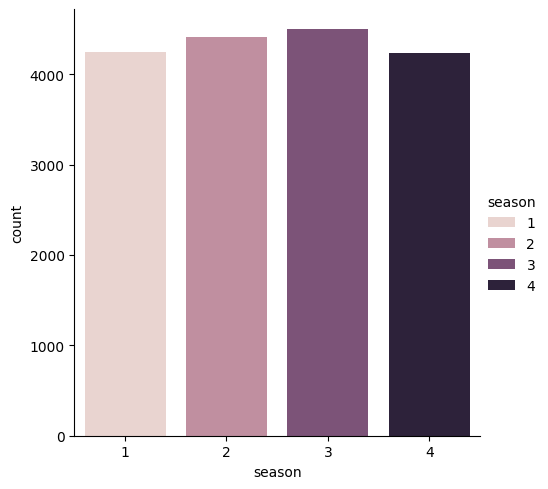

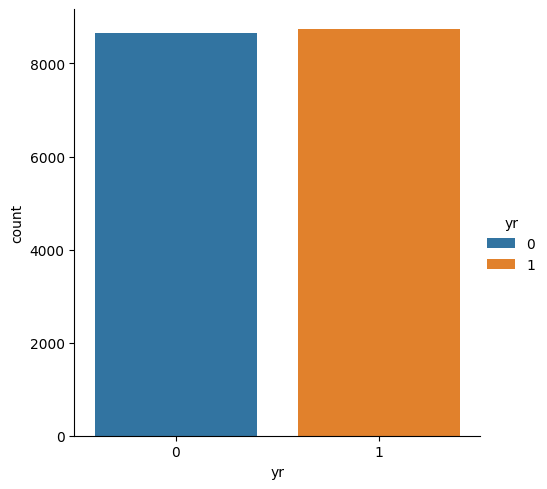

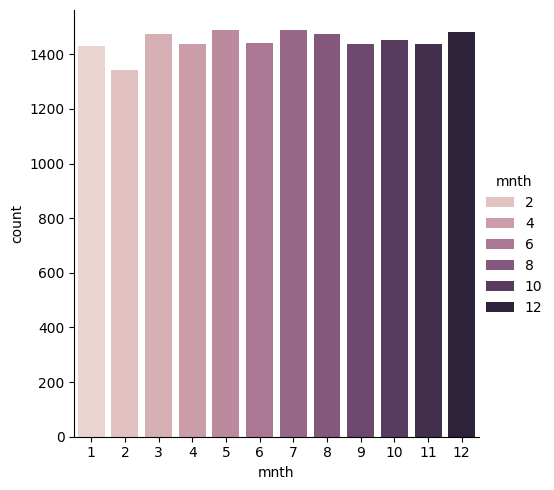

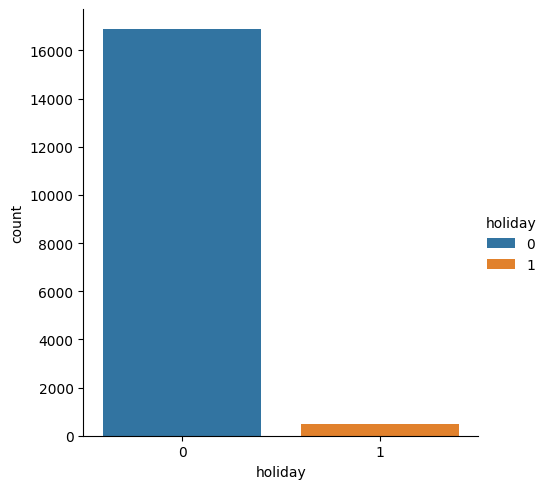

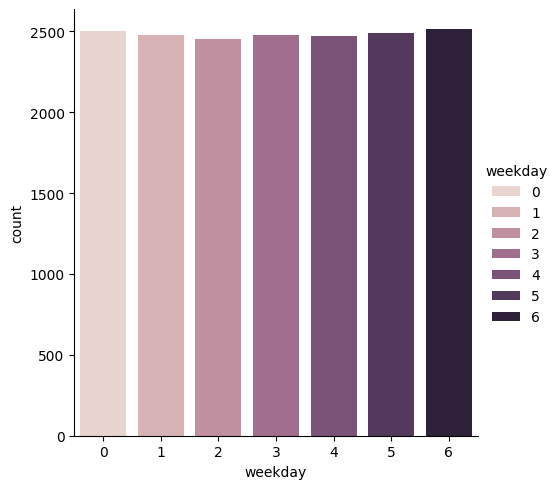

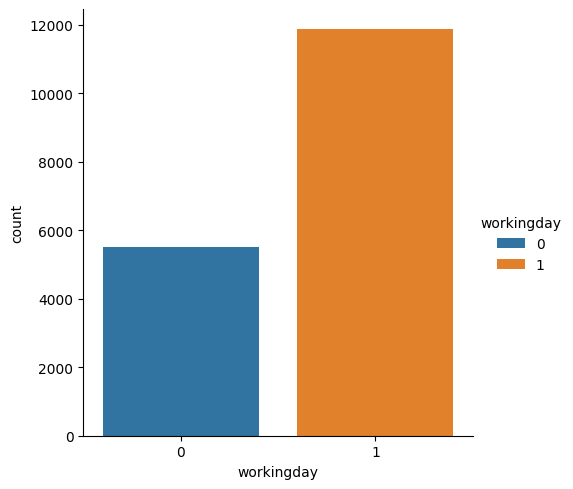

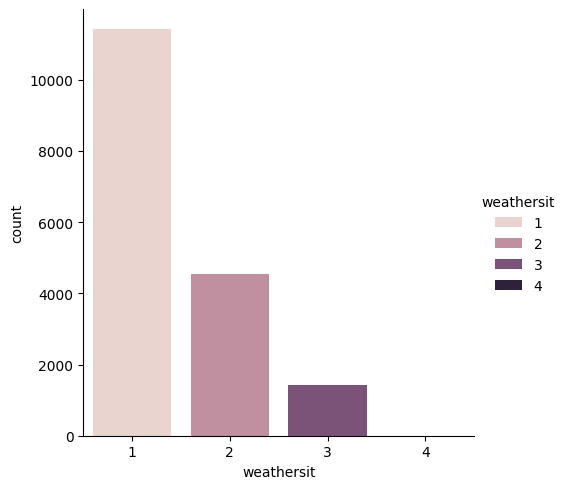

In [6]:
for col in cat_cols:
    ax = sns.catplot(kind='count', data=df_hourly, x=col, hue=col)

**OBSERVATIONS**
- Time based features are uniformly distributed as expected.
- Class imbalance is observed in weathersit, workingday and holiday features. 

#### Numerical Features

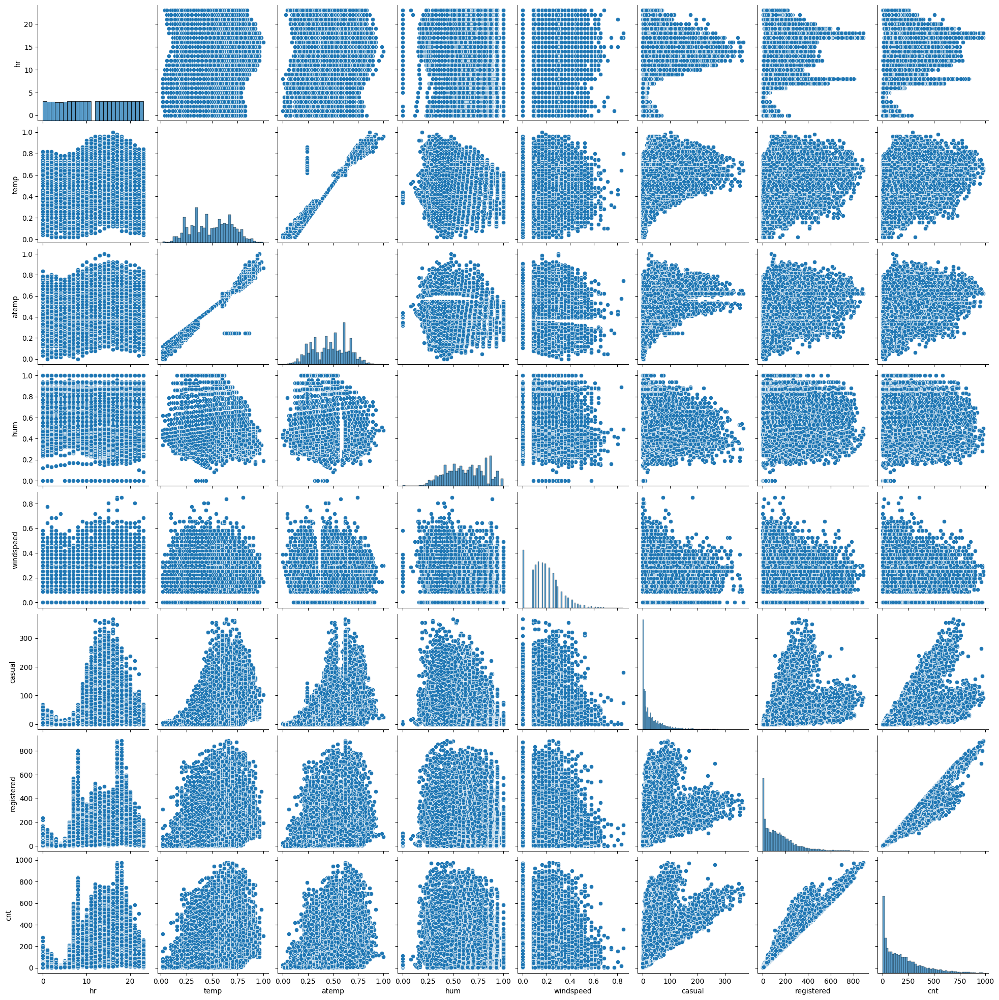

In [19]:
sns.pairplot(df_hourly[num_cols])

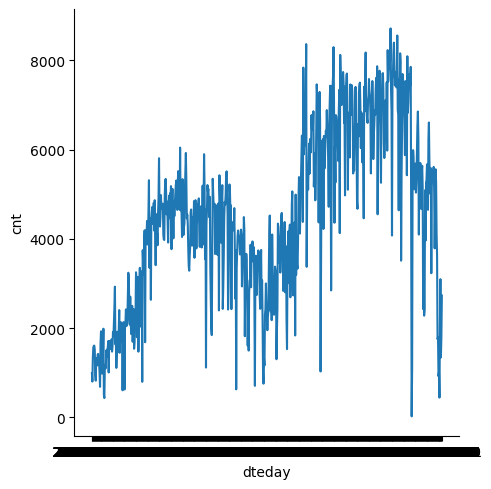

In [9]:
sns.relplot(data=df_daily, x="dteday", y="cnt", kind="line")

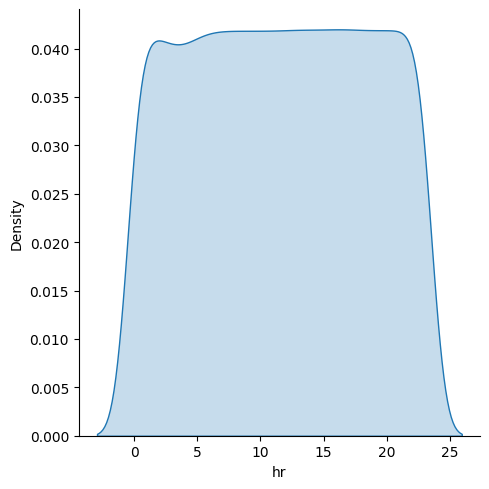

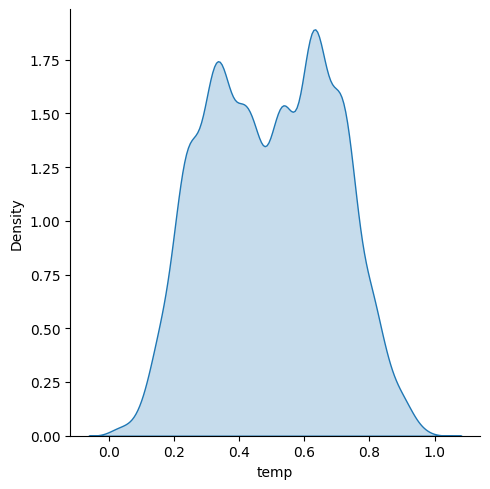

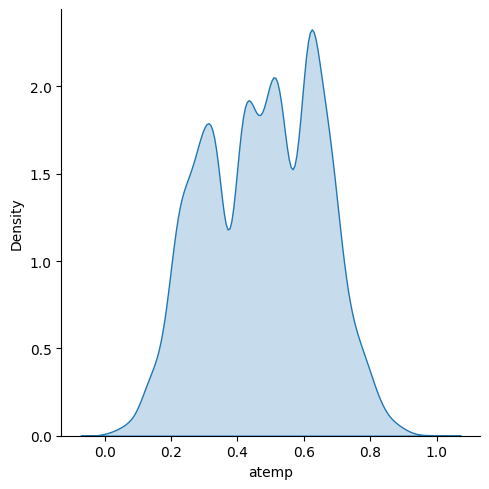

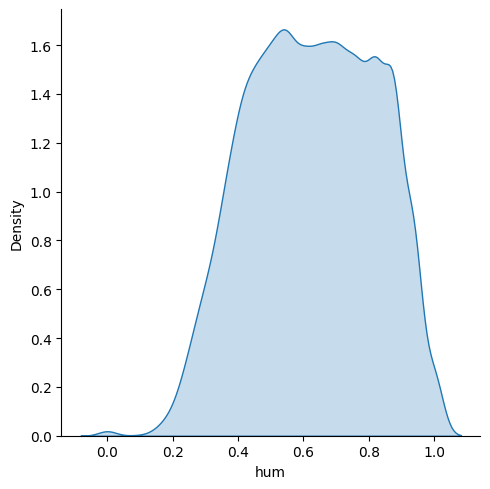

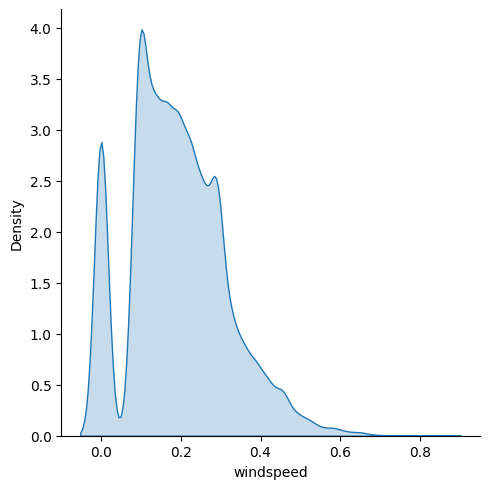

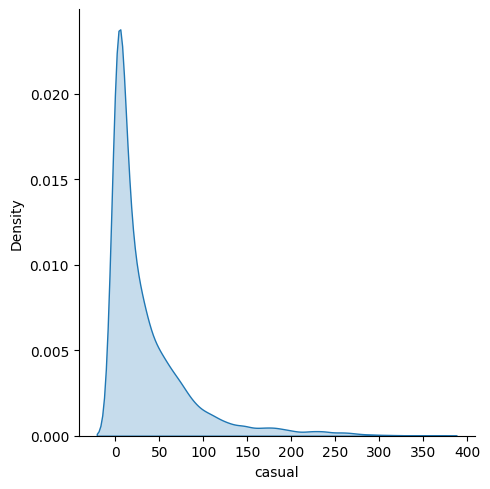

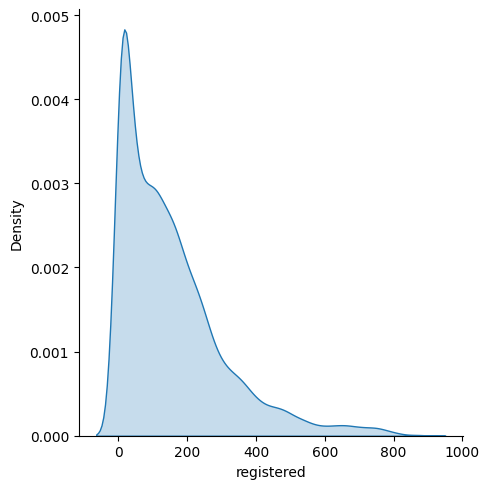

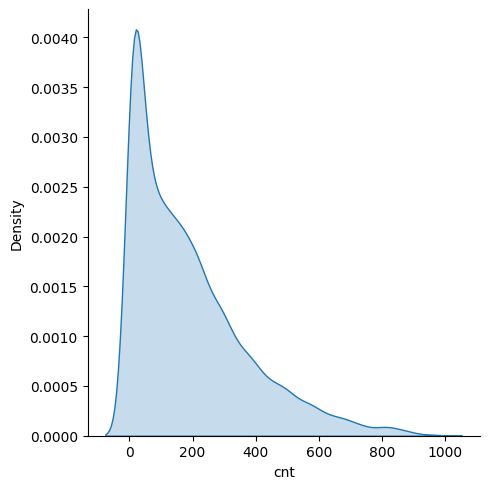

In [7]:
for col in num_cols:
    sns.displot(kind='kde', data=df_hourly, x=col, fill=True)

#### Target Guided Feature Visualizations

In [16]:
def target_summary_with_cat(dataframe, target, categorical_col):
    """
    Kategorik bir özellik ile hedef değişken arasındaki ortalama ilişkiyi gösterir.

    Parametreler:
    dataframe : pandas.DataFrame
        Veri seti.
    target : str
        Hedef değişkenin adı.
    categorical_col : str
        Kategorik özelliğin adı.
    """
    print(pd.DataFrame({"TARGET_MEAN": dataframe.groupby(categorical_col)[target].mean()}), end="\n\n\n")

def target_summary_with_num(dataframe, target, numerical_col):
    """
    Sayısal bir özellik ile hedef değişken arasındaki ortalama ilişkiyi gösterir.

    Parametreler:
    dataframe : pandas.DataFrame
        Veri seti.
    target : str
        Hedef değişkenin adı.
    numerical_col : str
        Sayısal özelliğin adı.
    """
    print(dataframe.groupby(target).agg({numerical_col: ['mean', 'median', 'std', 'min', 'max']}), end="\n\n\n")

##### Season

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869


    TARGET_MEAN
yr             
0       143.794
1       234.666


      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303


         TARGET_MEAN
holiday             
0            190.429
1            156.870


         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210


            TARGET_MEAN
workingday             
0               181.405
1               193.208


            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




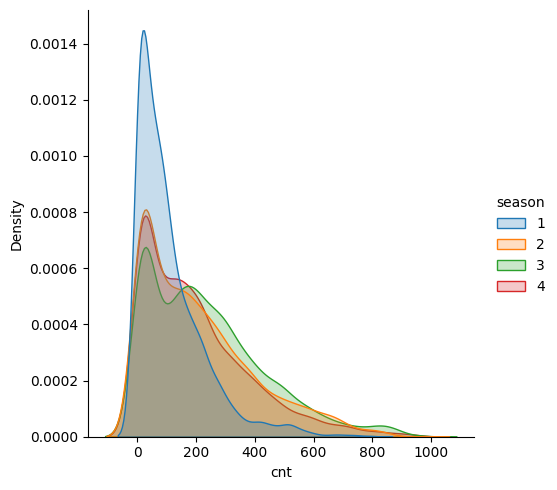

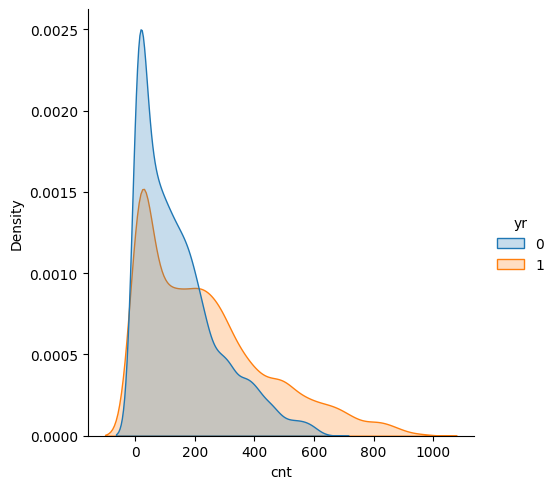

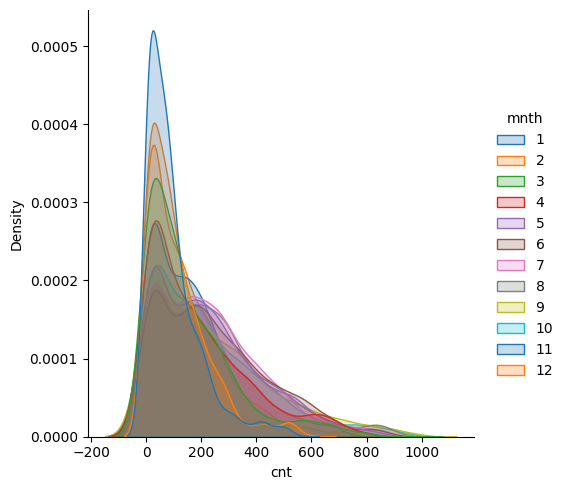

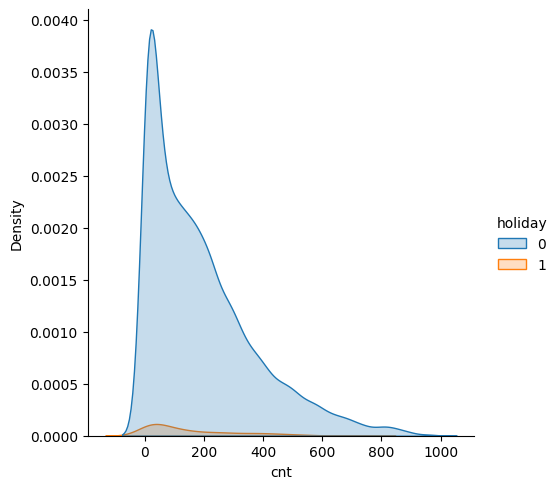

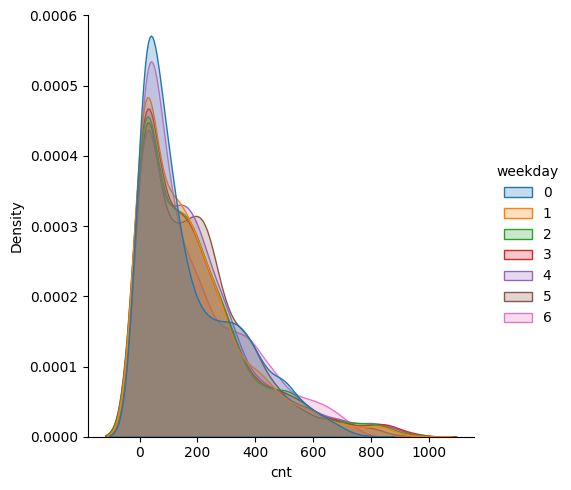

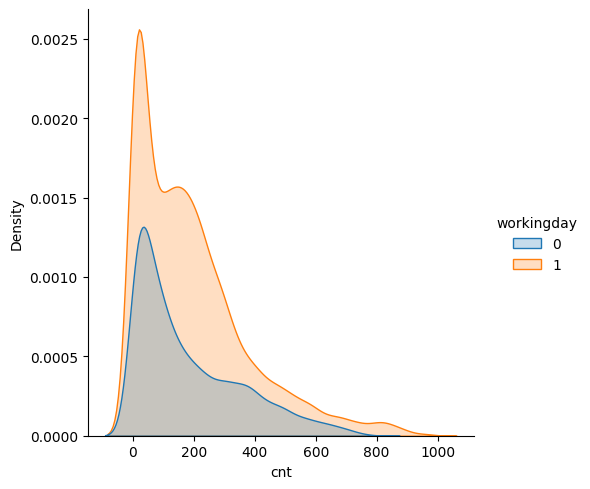

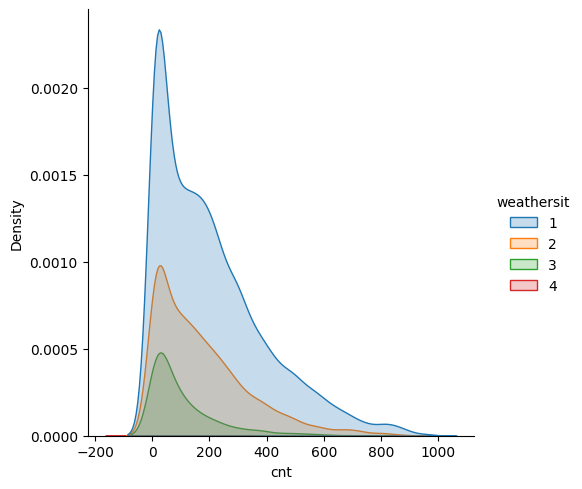

In [21]:
for col in cat_cols:
    sns.displot(kind='kde', data=df_hourly, x='cnt', hue=col, fill=True, palette='tab10')
    #sns.kdeplot(data=df_hourly, x='cnt', hue=col)
    target_summary_with_cat(df_hourly, 'cnt', col)

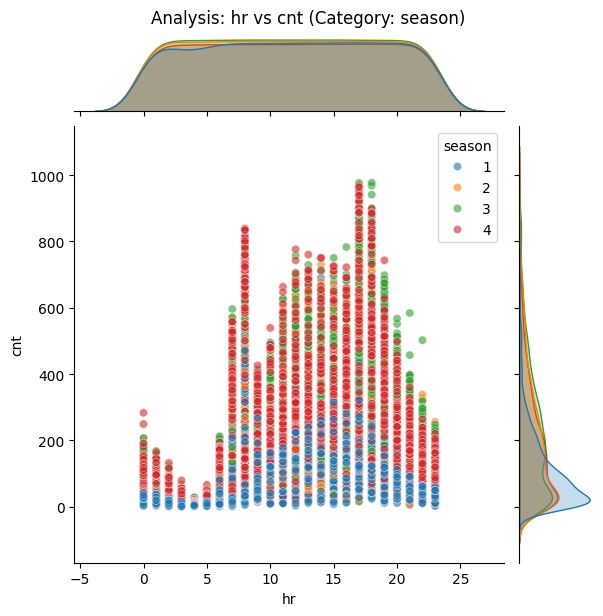

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869




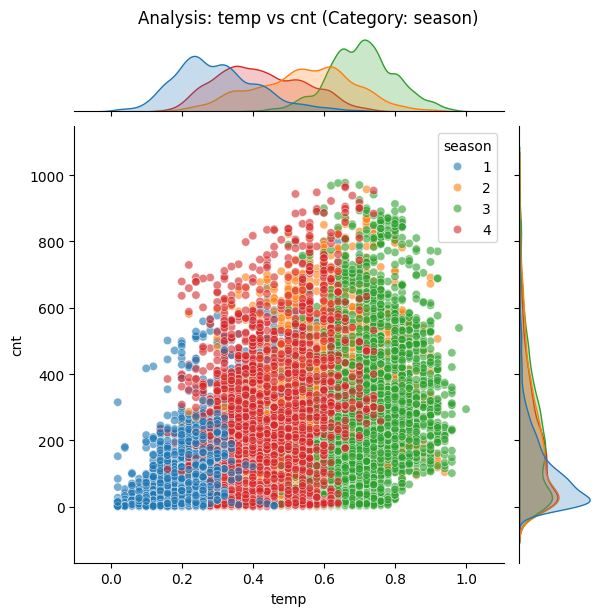

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869




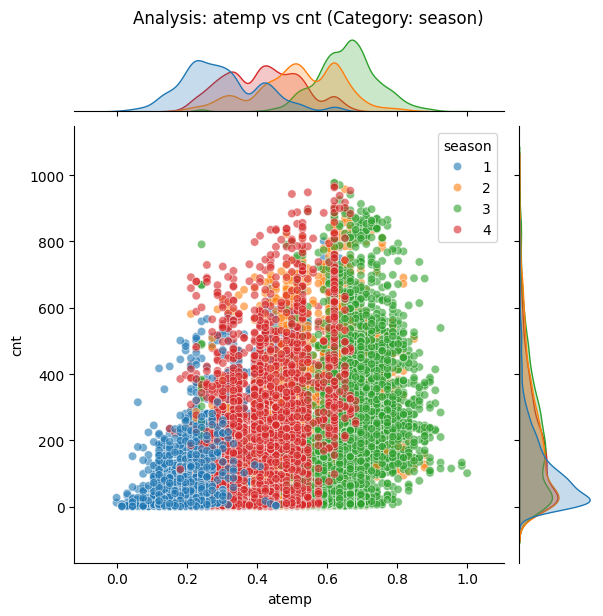

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869




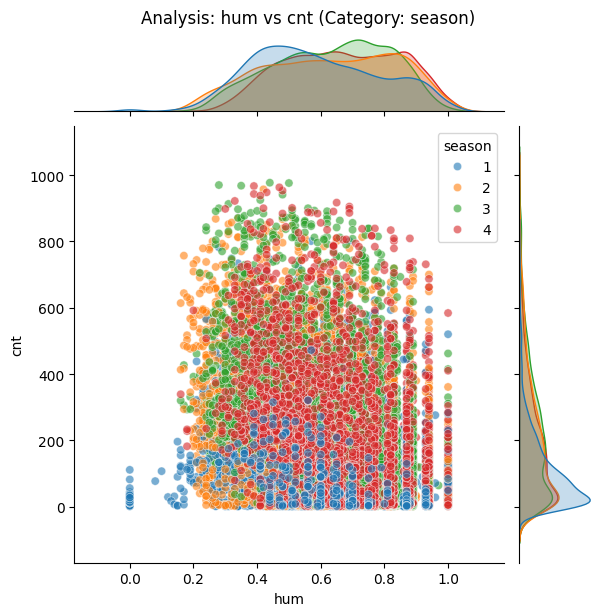

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869




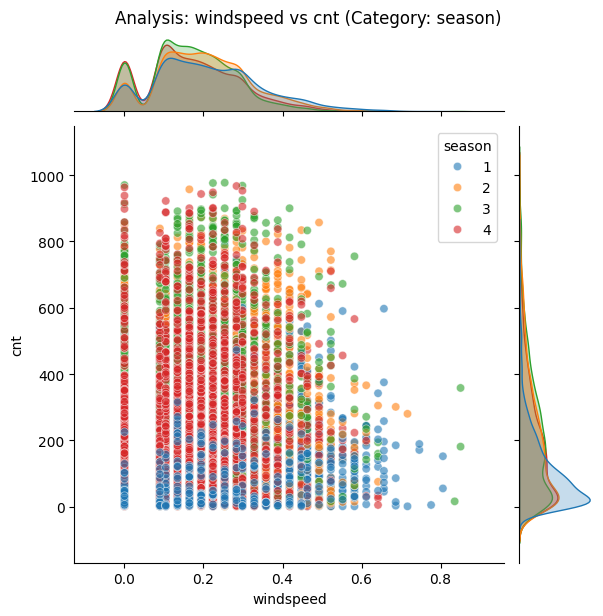

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869




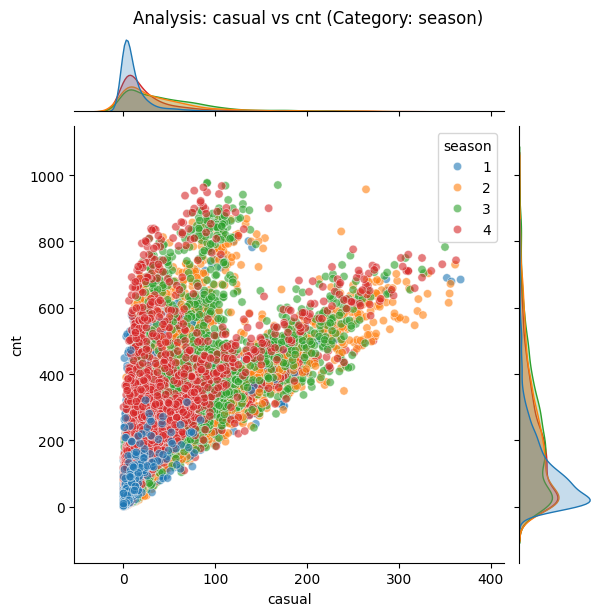

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869




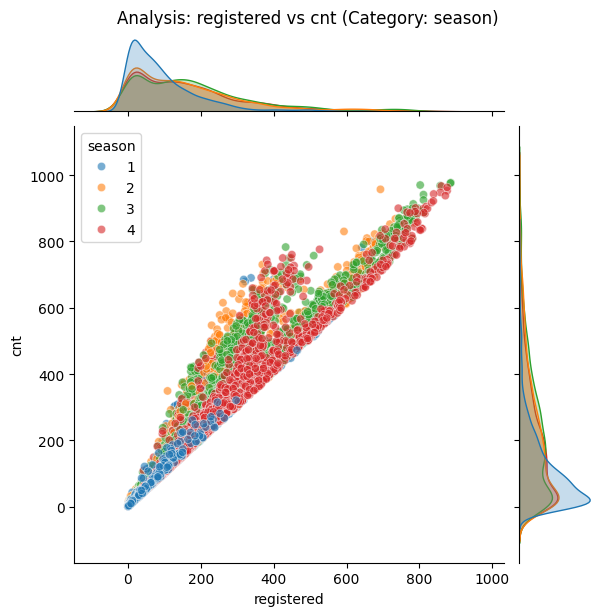

        TARGET_MEAN
season             
1           111.115
2           208.344
3           236.016
4           198.869




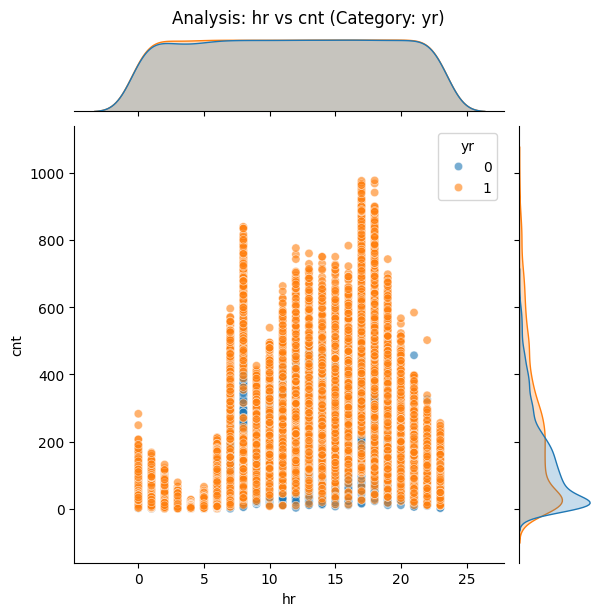

    TARGET_MEAN
yr             
0       143.794
1       234.666




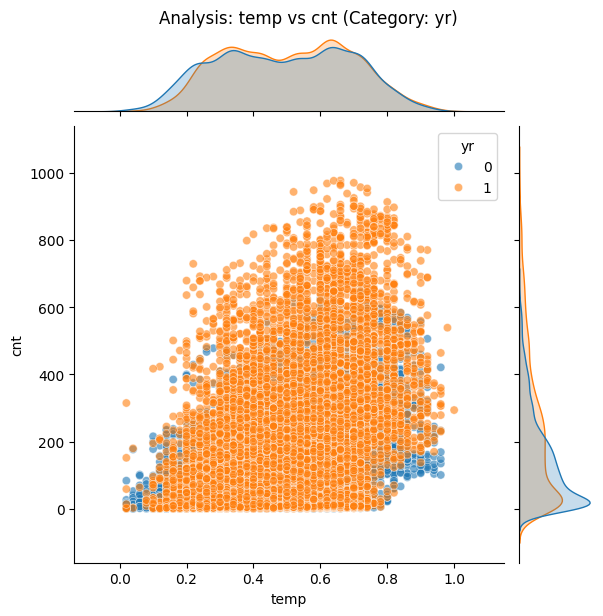

    TARGET_MEAN
yr             
0       143.794
1       234.666




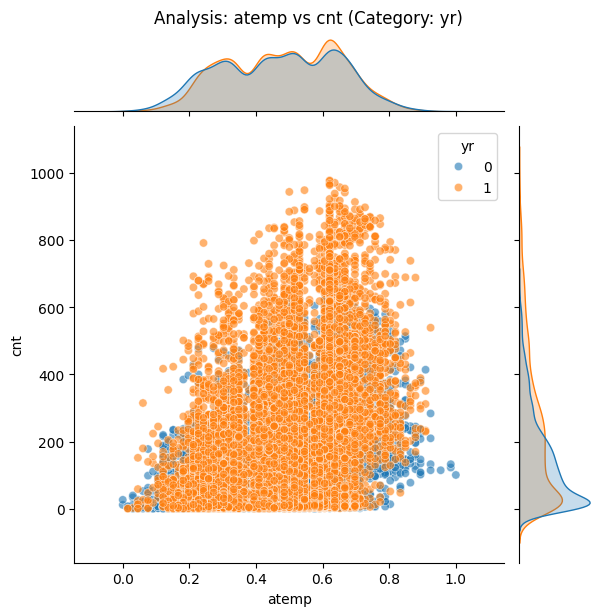

    TARGET_MEAN
yr             
0       143.794
1       234.666




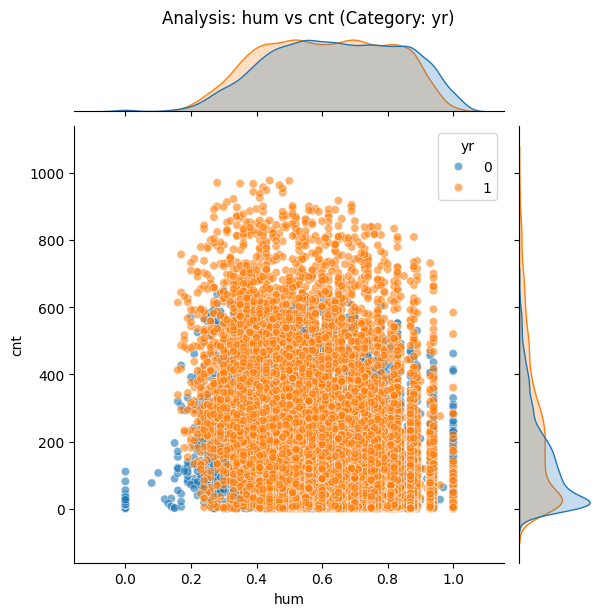

    TARGET_MEAN
yr             
0       143.794
1       234.666




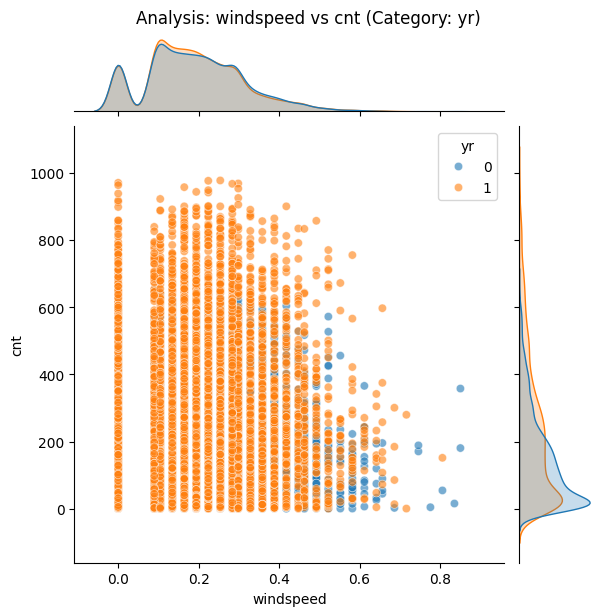

    TARGET_MEAN
yr             
0       143.794
1       234.666




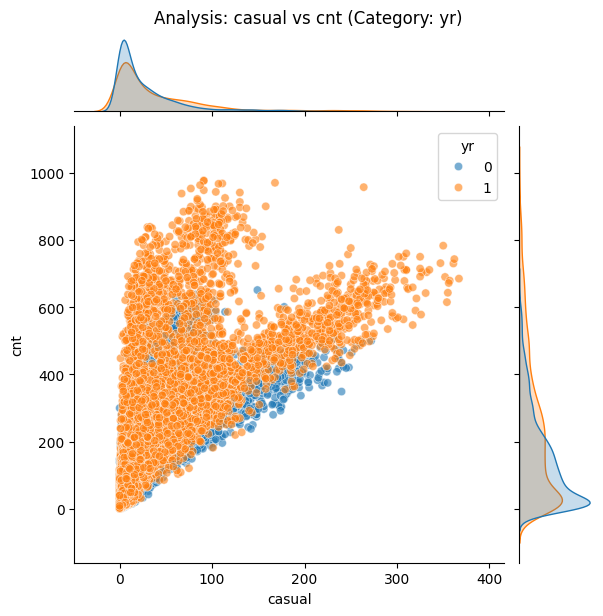

    TARGET_MEAN
yr             
0       143.794
1       234.666




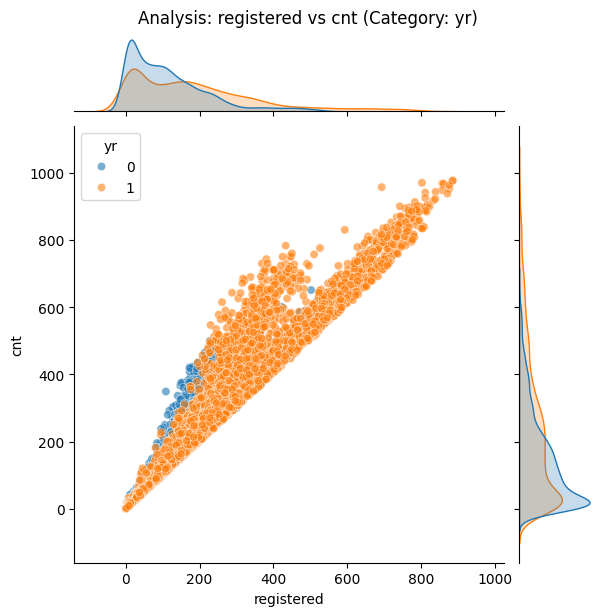

    TARGET_MEAN
yr             
0       143.794
1       234.666




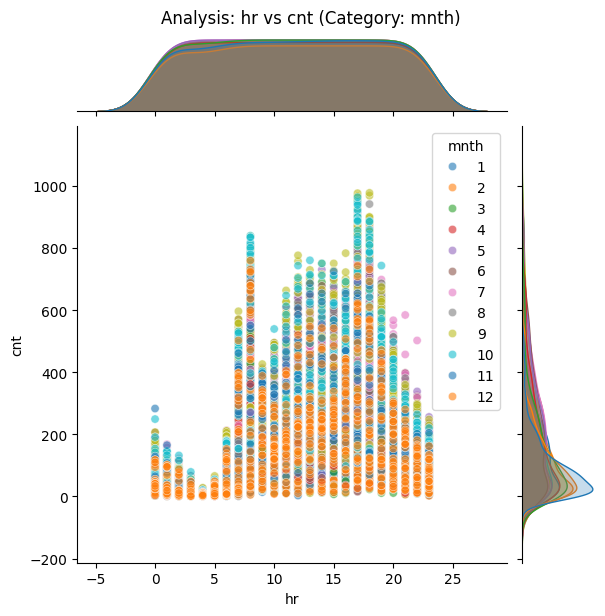

      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303




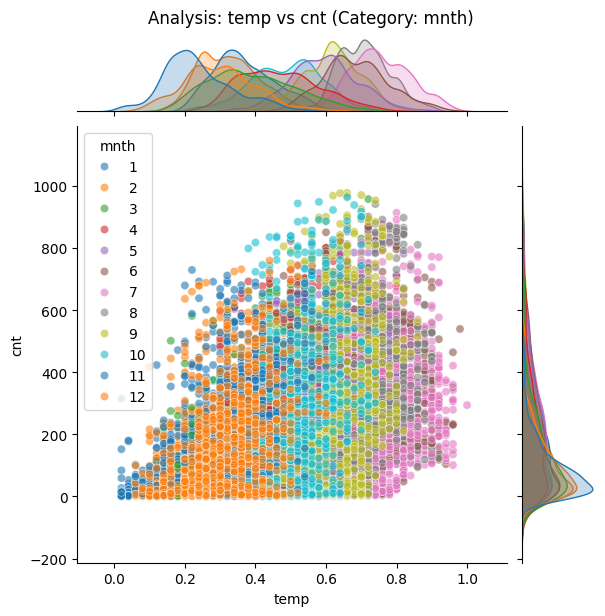

      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303




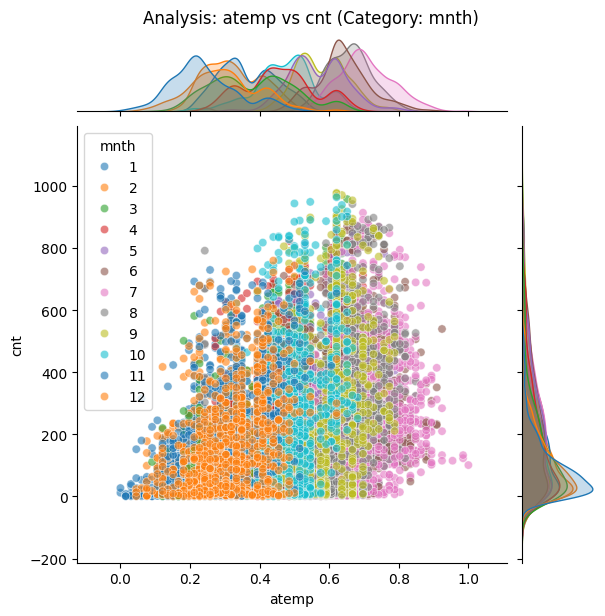

      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303




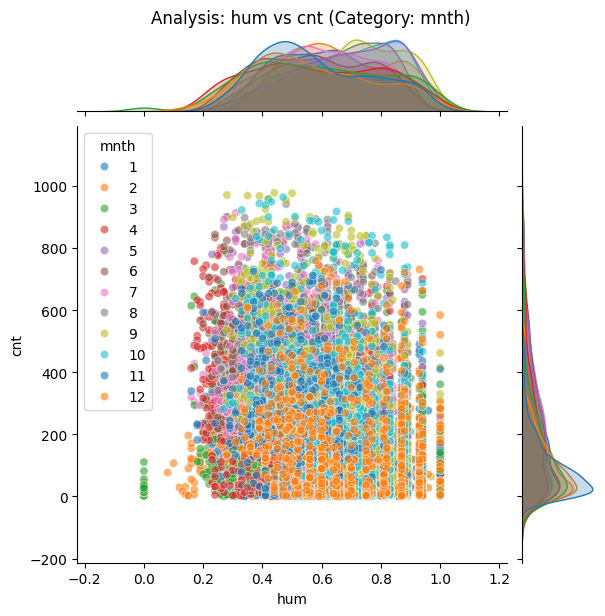

      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303




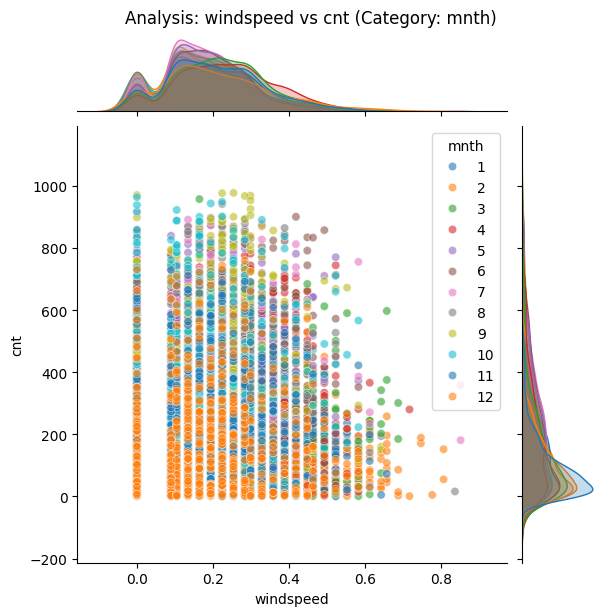

      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303




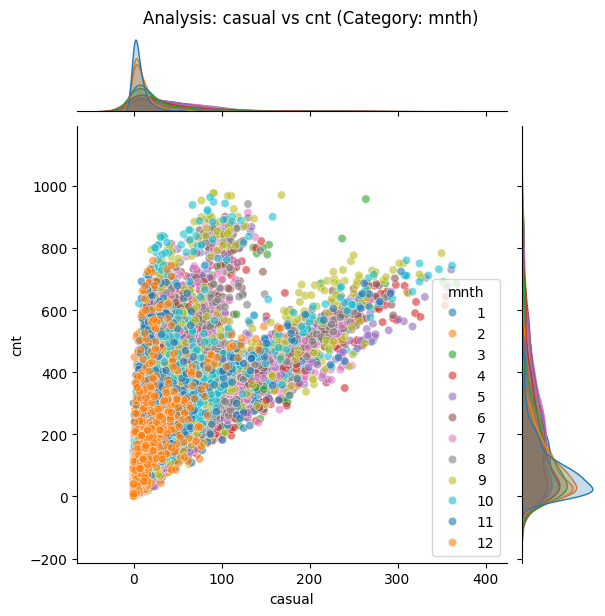

      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303




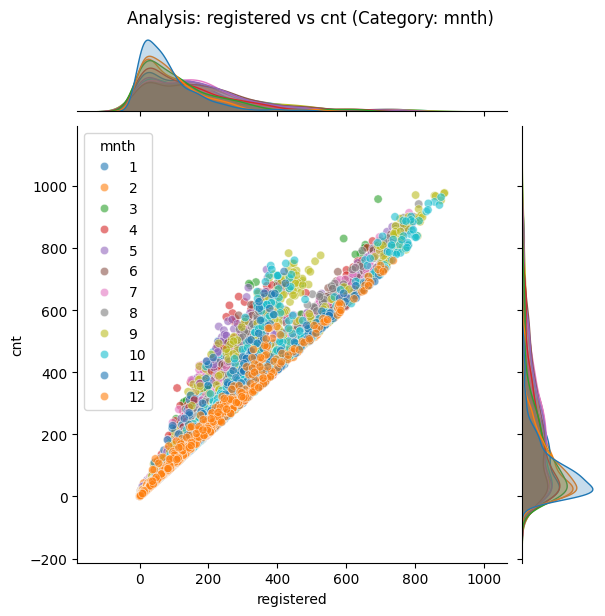

      TARGET_MEAN
mnth             
1          94.425
2         112.865
3         155.411
4         187.261
5         222.907
6         240.515
7         231.820
8         238.098
9         240.773
10        222.159
11        177.335
12        142.303




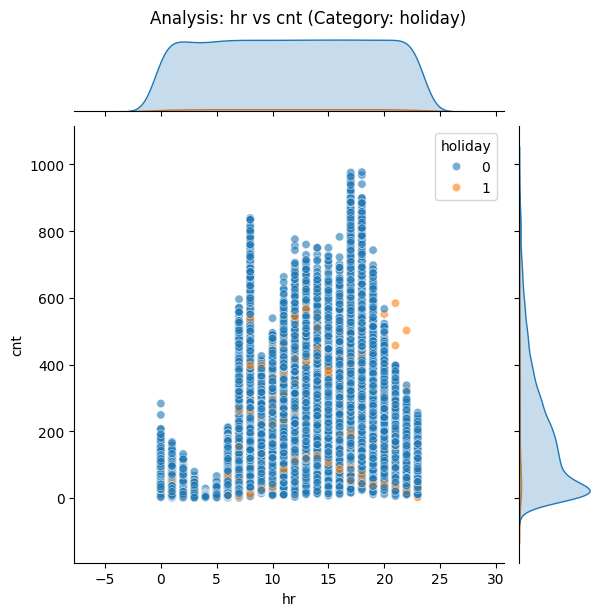

         TARGET_MEAN
holiday             
0            190.429
1            156.870




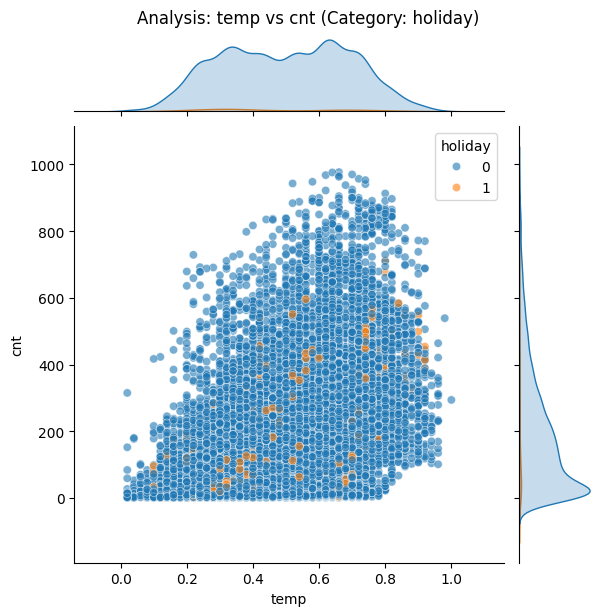

         TARGET_MEAN
holiday             
0            190.429
1            156.870




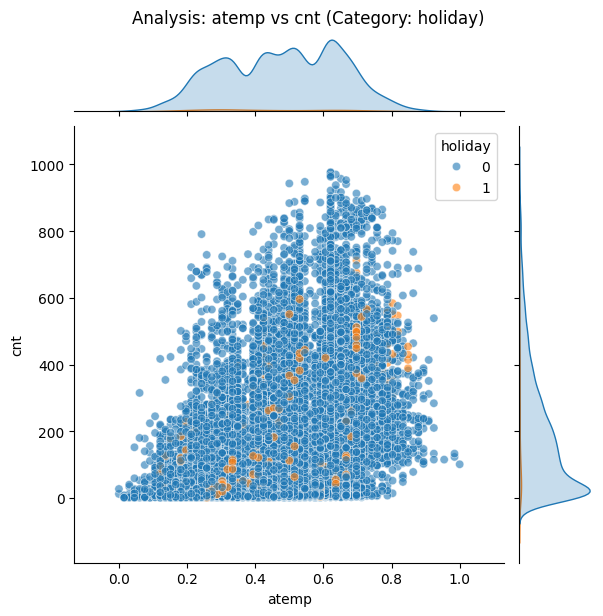

         TARGET_MEAN
holiday             
0            190.429
1            156.870




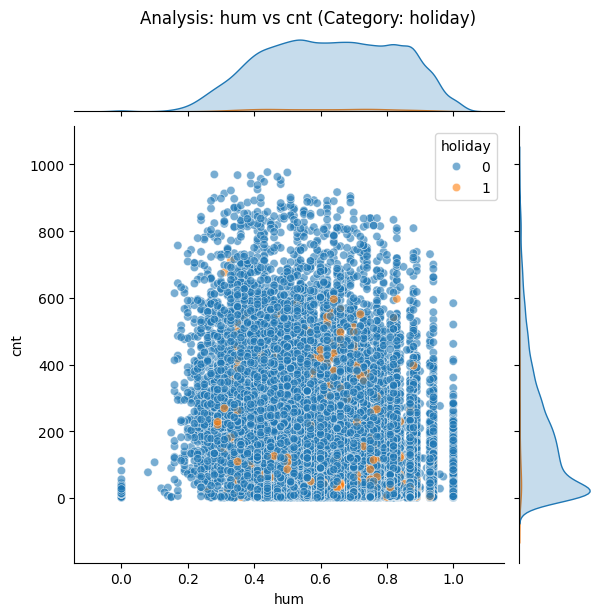

         TARGET_MEAN
holiday             
0            190.429
1            156.870




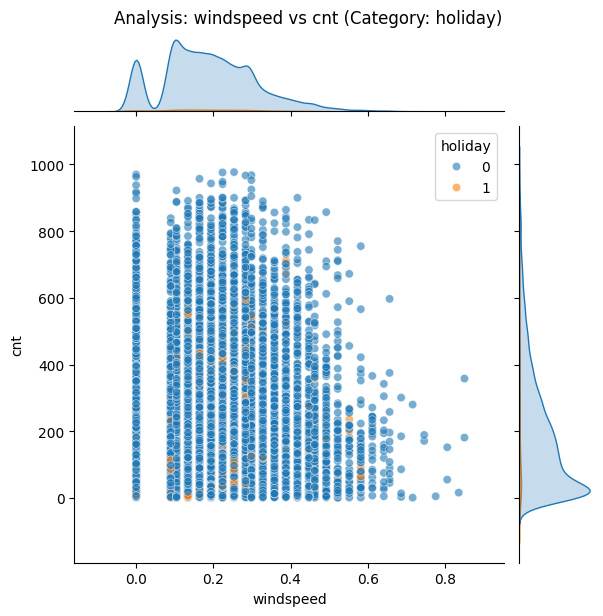

         TARGET_MEAN
holiday             
0            190.429
1            156.870




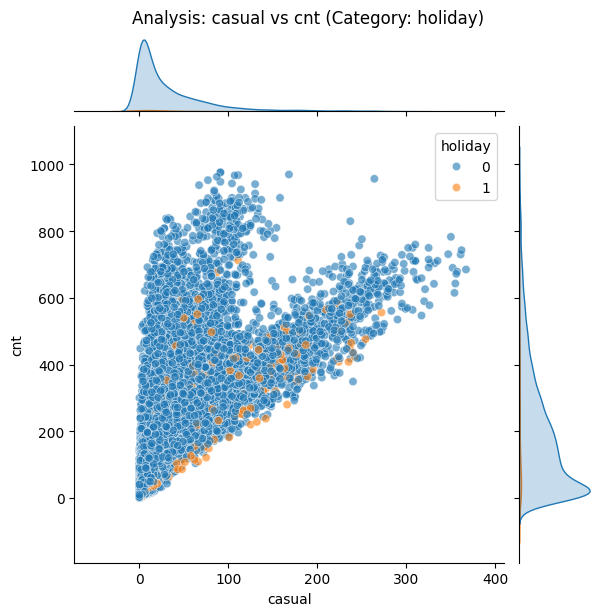

         TARGET_MEAN
holiday             
0            190.429
1            156.870




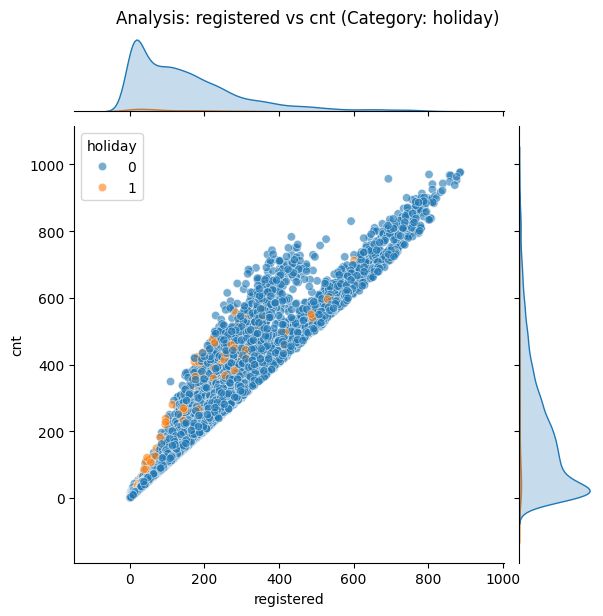

         TARGET_MEAN
holiday             
0            190.429
1            156.870




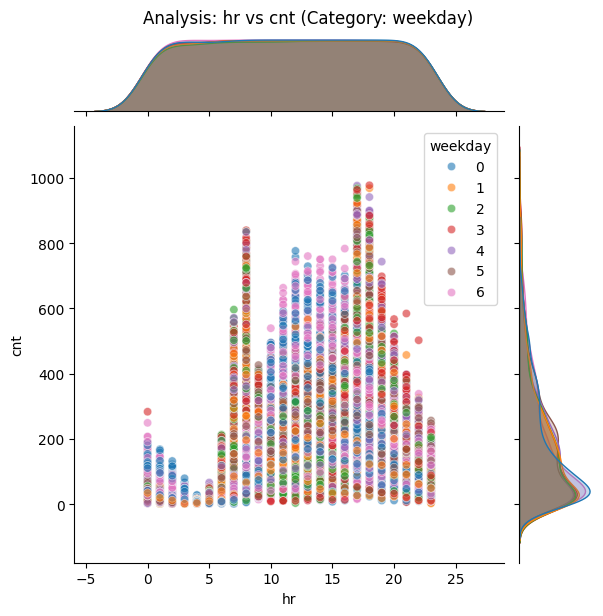

         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210




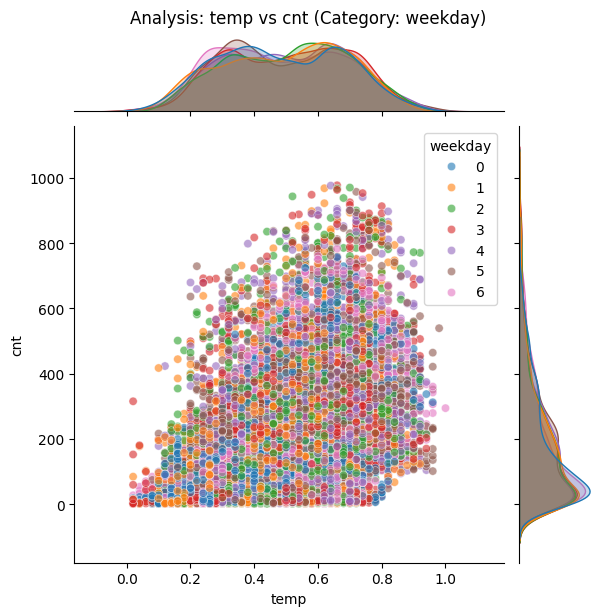

         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210




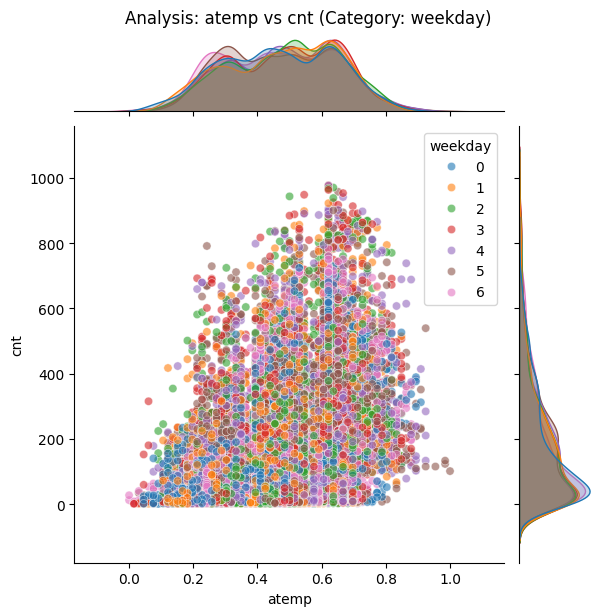

         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210




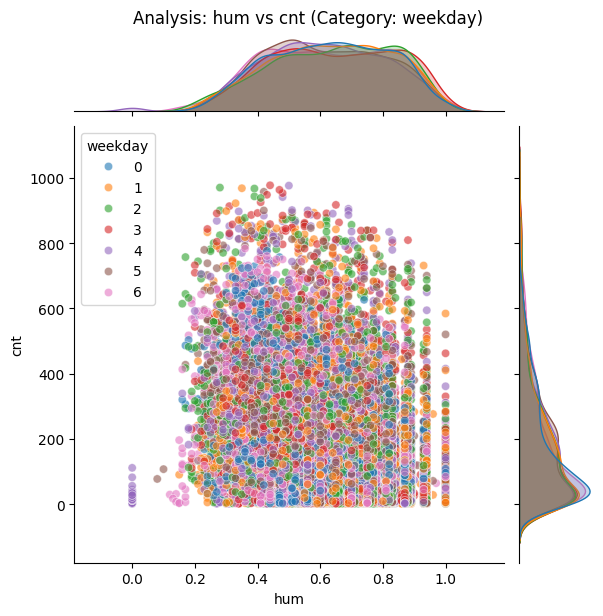

         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210




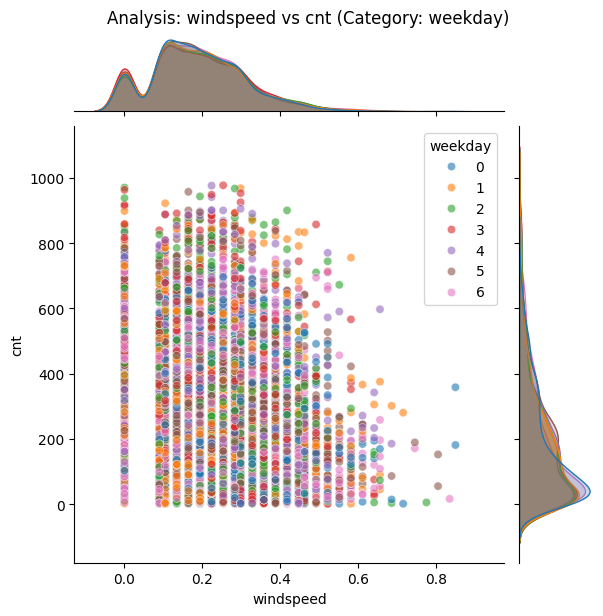

         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210




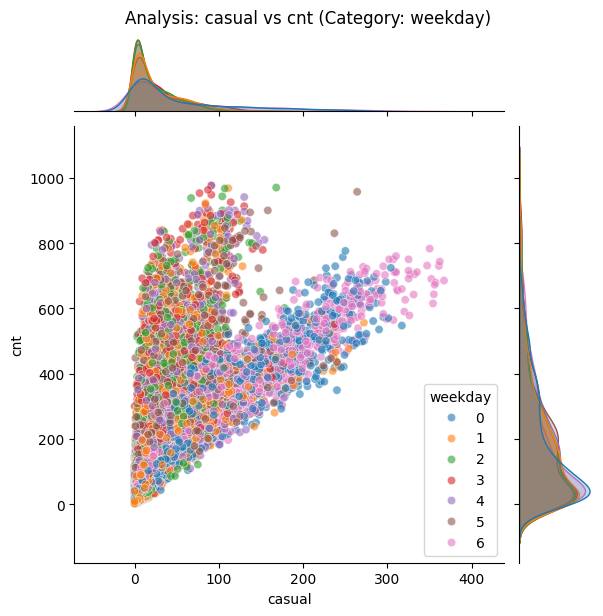

         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210




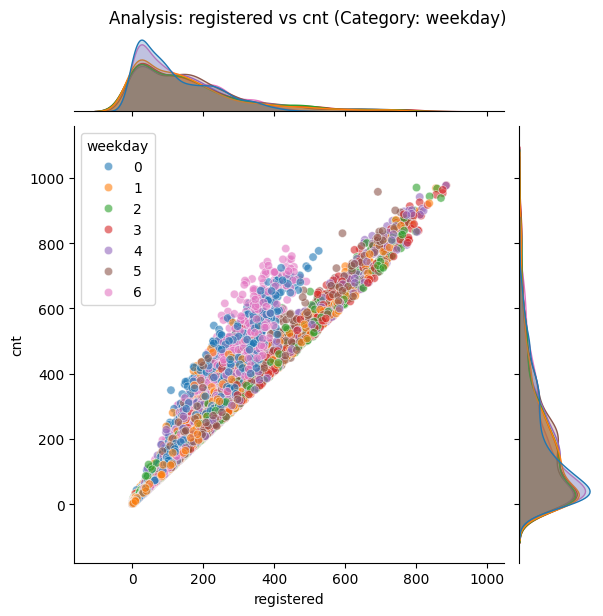

         TARGET_MEAN
weekday             
0            177.469
1            183.745
2            191.239
3            191.131
4            196.437
5            196.136
6            190.210




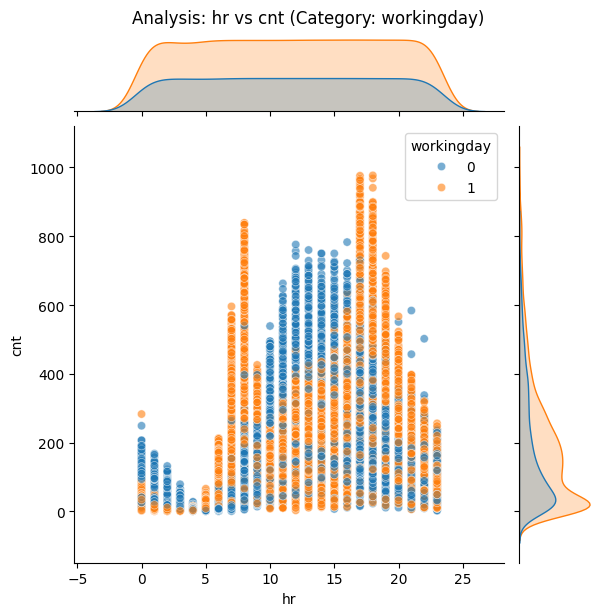

            TARGET_MEAN
workingday             
0               181.405
1               193.208




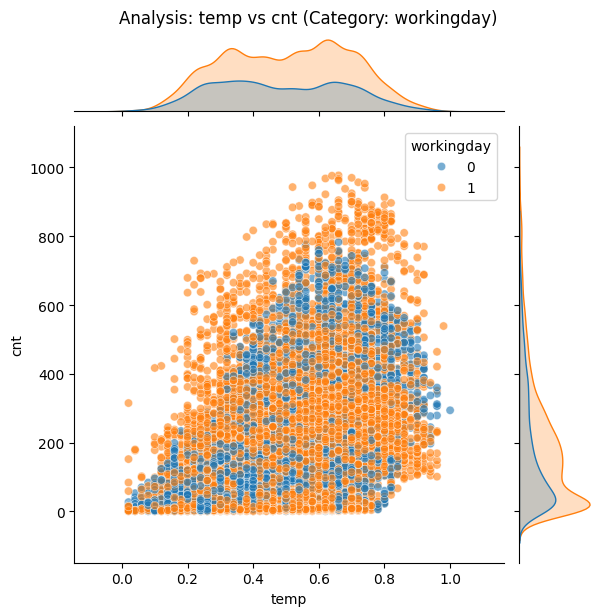

            TARGET_MEAN
workingday             
0               181.405
1               193.208




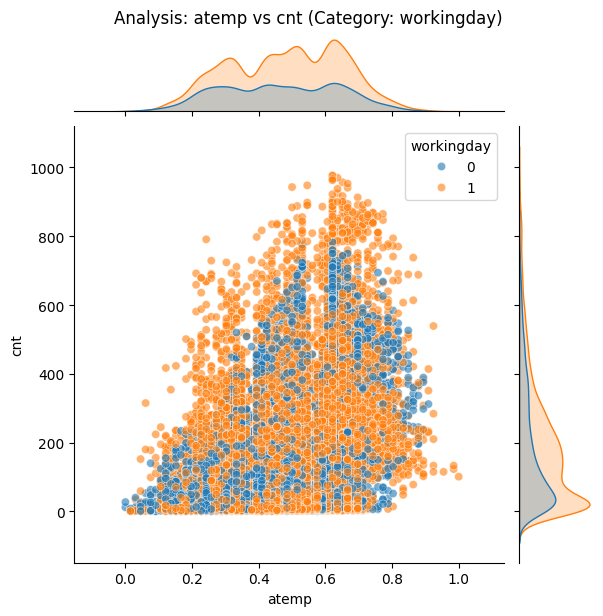

            TARGET_MEAN
workingday             
0               181.405
1               193.208




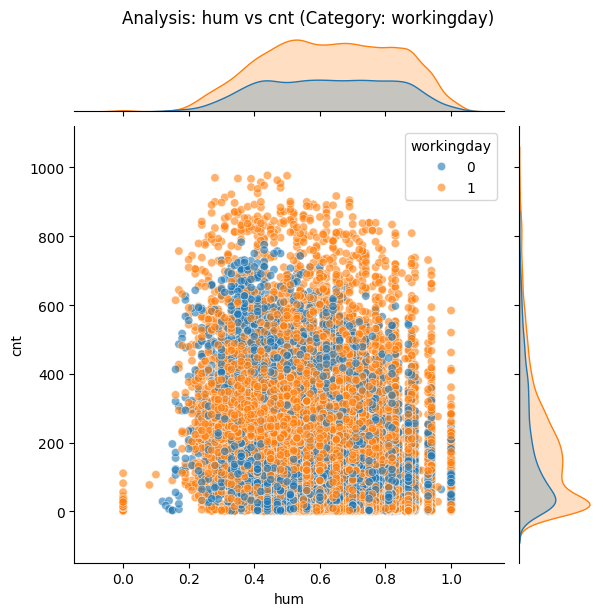

            TARGET_MEAN
workingday             
0               181.405
1               193.208




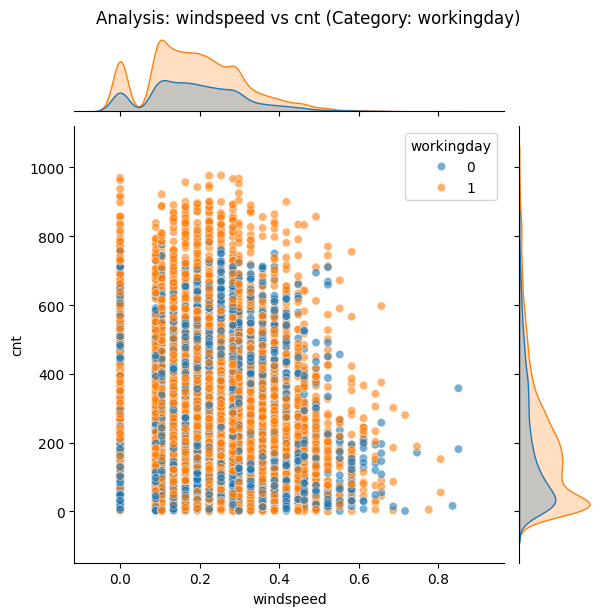

            TARGET_MEAN
workingday             
0               181.405
1               193.208




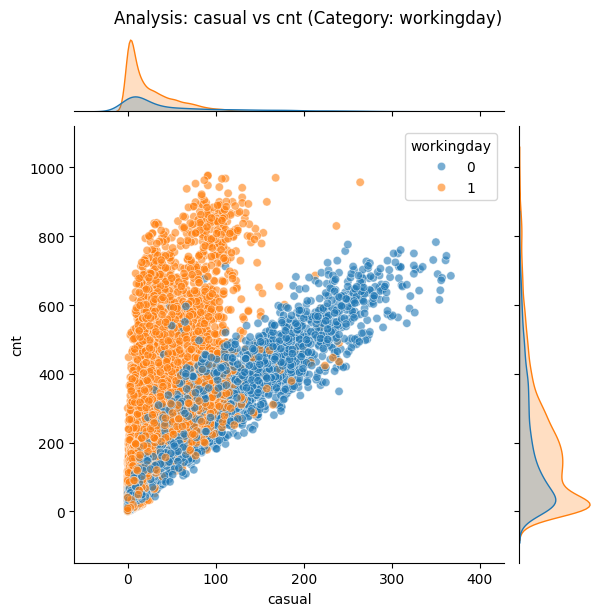

            TARGET_MEAN
workingday             
0               181.405
1               193.208




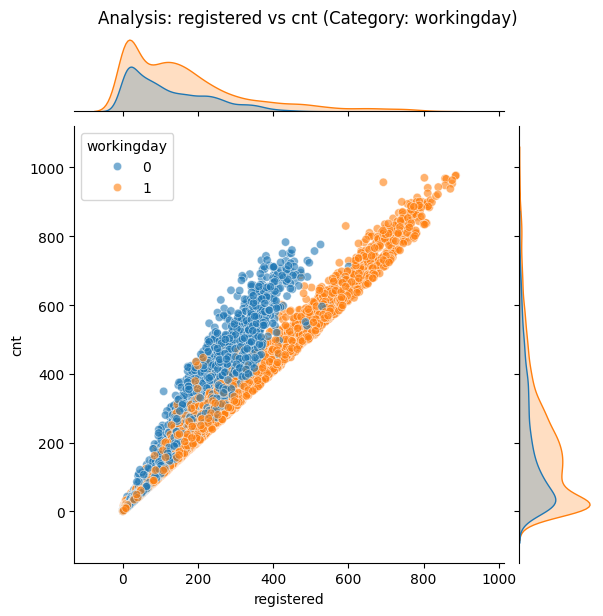

            TARGET_MEAN
workingday             
0               181.405
1               193.208




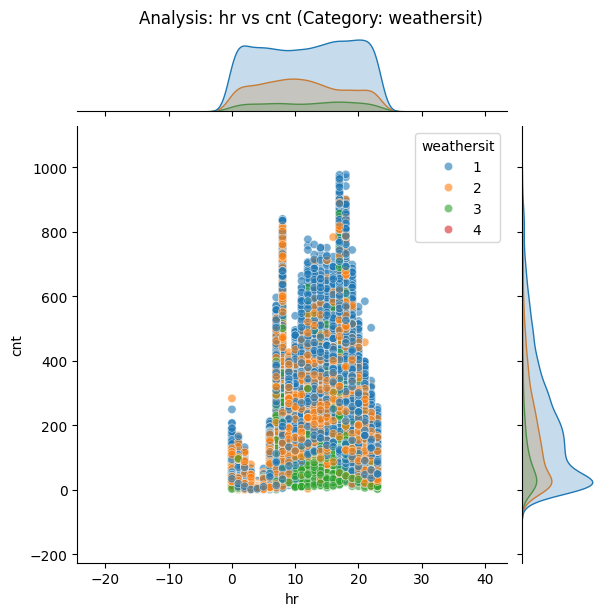

            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




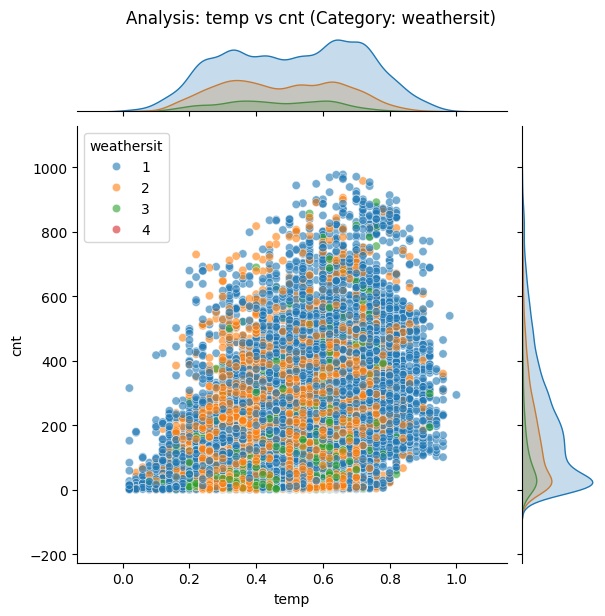

            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




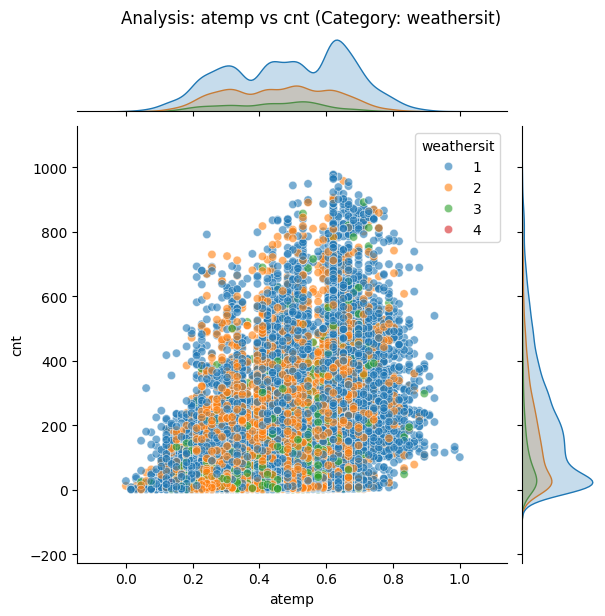

            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




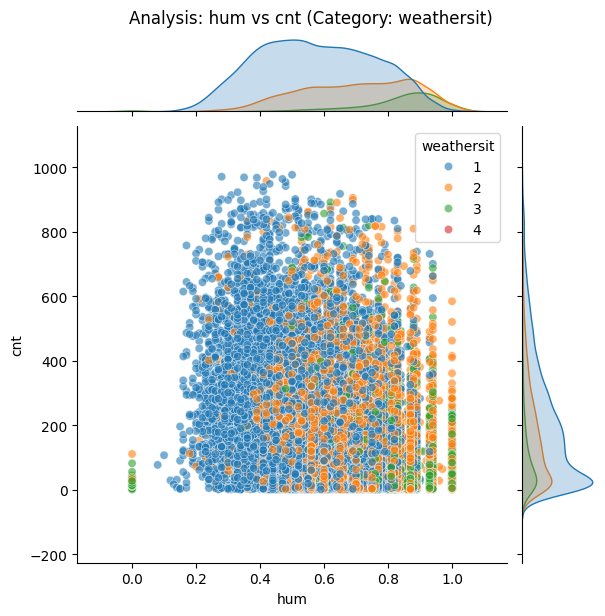

            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




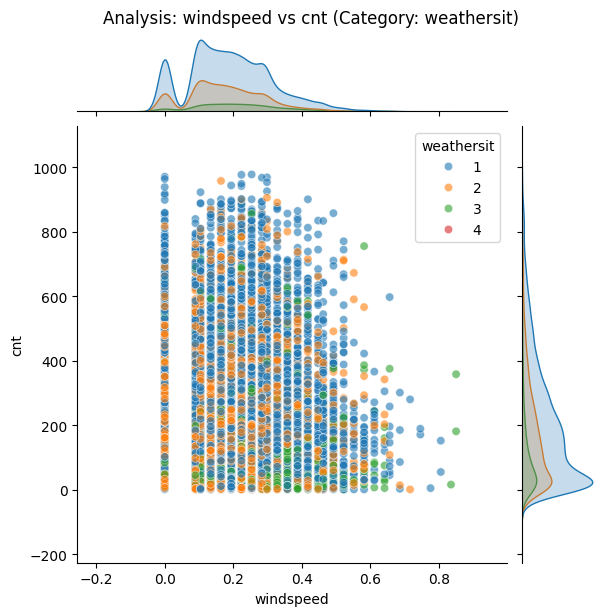

            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




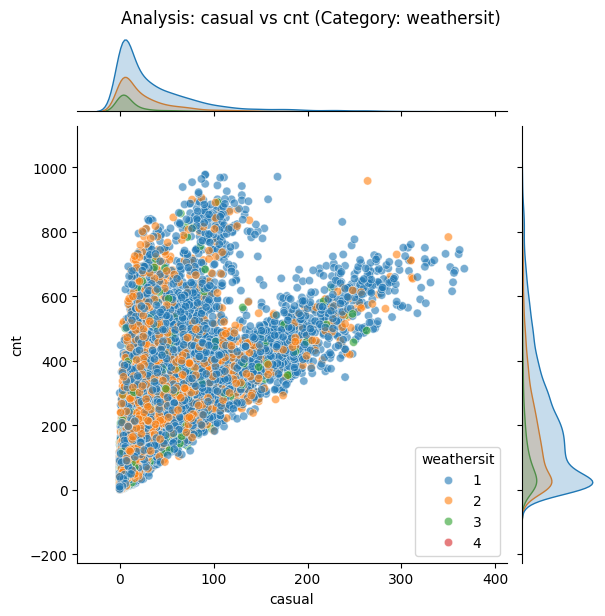

            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




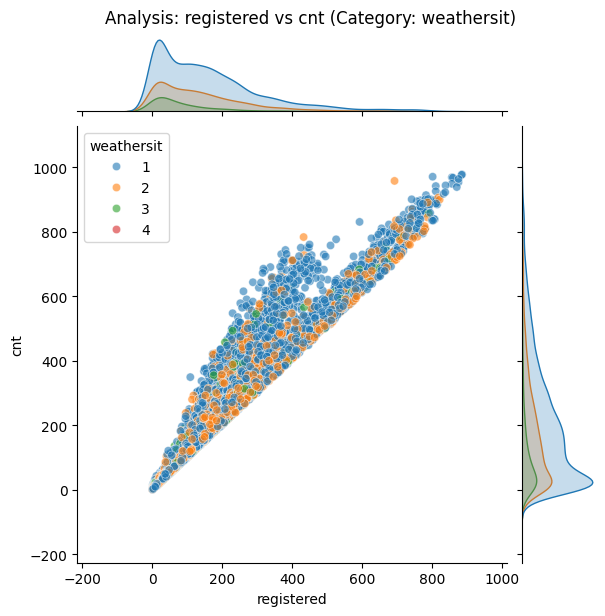

            TARGET_MEAN
weathersit             
1               204.869
2               175.165
3               111.579
4                74.333




In [33]:
for catcol in cat_cols:
    target_nums = [col for col in num_cols if col not in ['cnt']]
    
    for numcol in target_nums:
        g = sns.jointplot(
            data=df_hourly,
            x=numcol, 
            y="cnt", 
            hue=catcol,
            kind="scatter",  
            alpha=0.6,       
            height=6,
            palette='tab10'         
        )
        
        g.figure.suptitle(f"Analysis: {numcol} vs cnt (Category: {catcol})", y=1.02)
        
        plt.show()

        target_summary_with_cat(df_hourly, 'cnt', catcol)